Julie Kumar, Final Project

## **Hypothesis:**
 The recent history (62 time steps) of a car's movement characteristics (including position, velocity, acceleration, etc.) contains predictable patterns that can be learned by a sequence model like various LSTMs to forecast its near-future state (specifically, 'Local_X', 'Local_Y' for the next 5 time steps).
The project also implicitly tests the hypothesis that different implementations (NumPy vs. optimized libraries like PyTorch/Keras) and architectural variations (unidirectional LSTM vs. BiLSTM vs. LSTM+Attention) will exhibit different learning efficiencies and predictive performances on this specific task.

## **Obtained results**

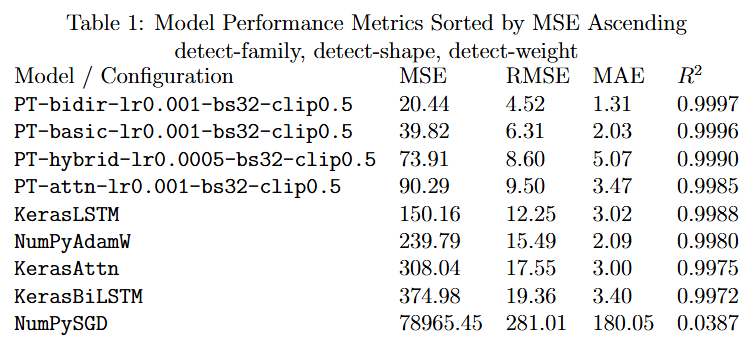

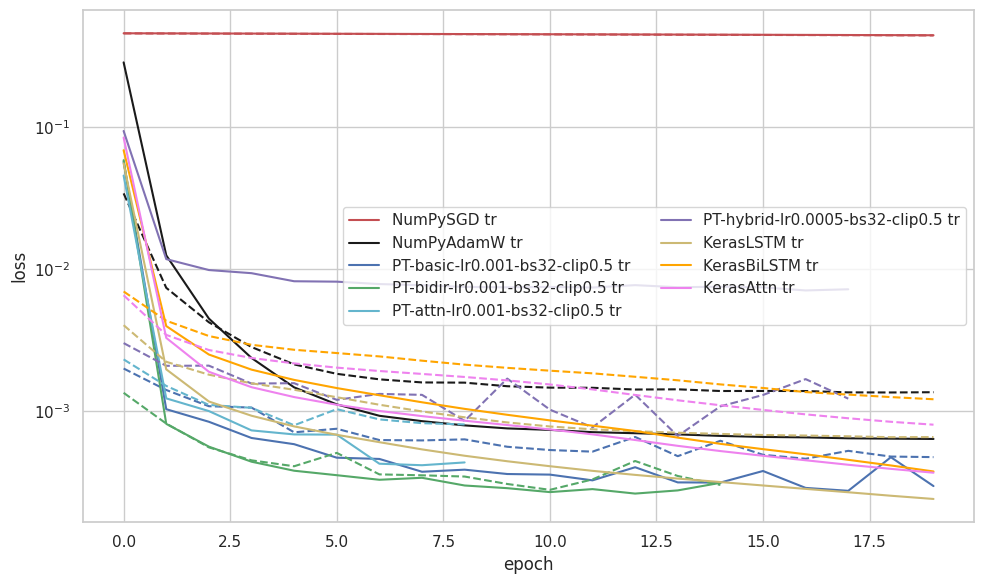

## **Testing results **

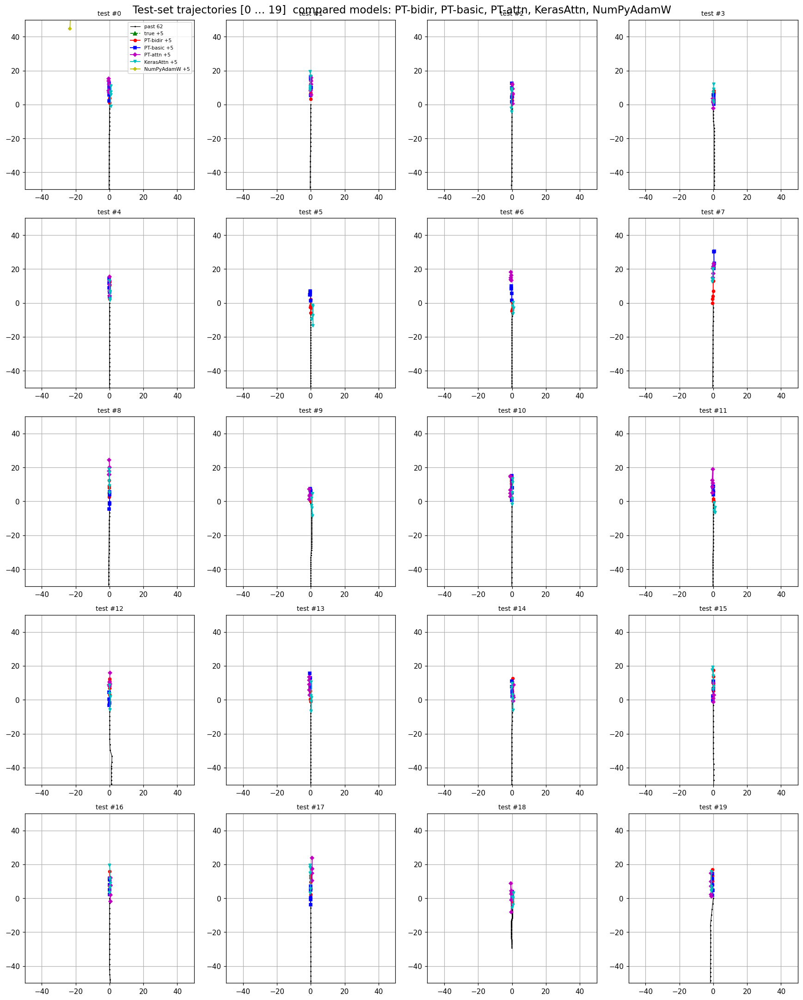

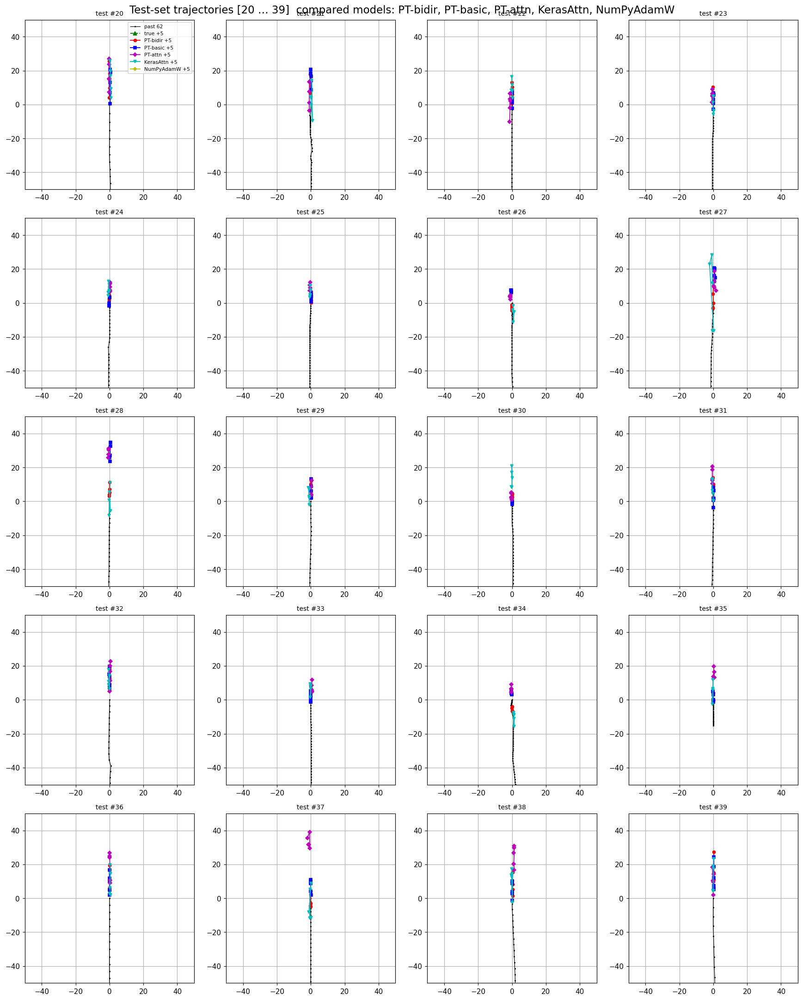

Best / lowest validation-set losses

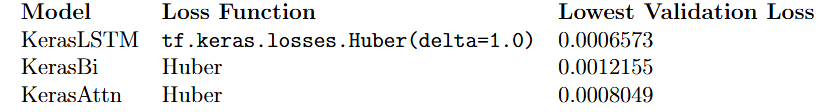

## **Project code**

## **LSTM implementations**

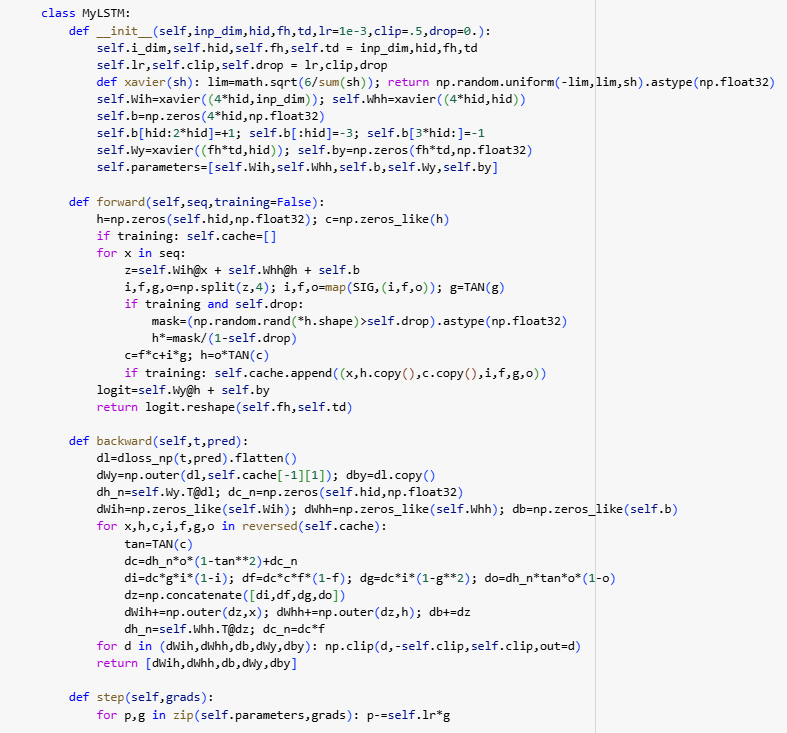

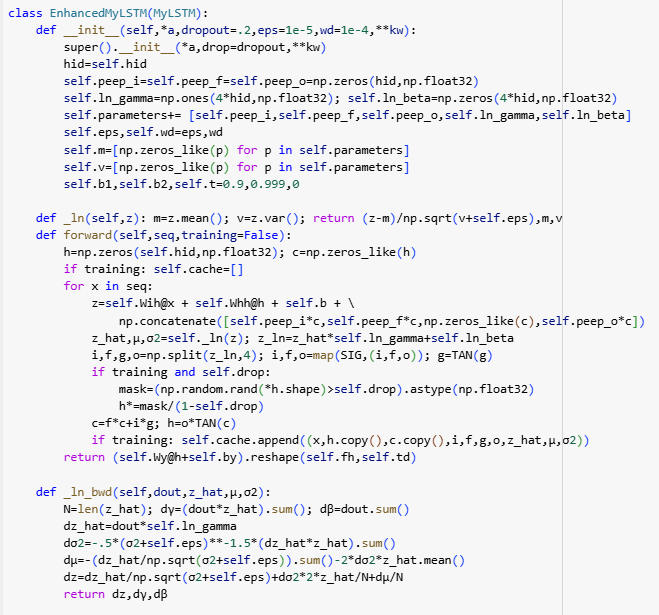 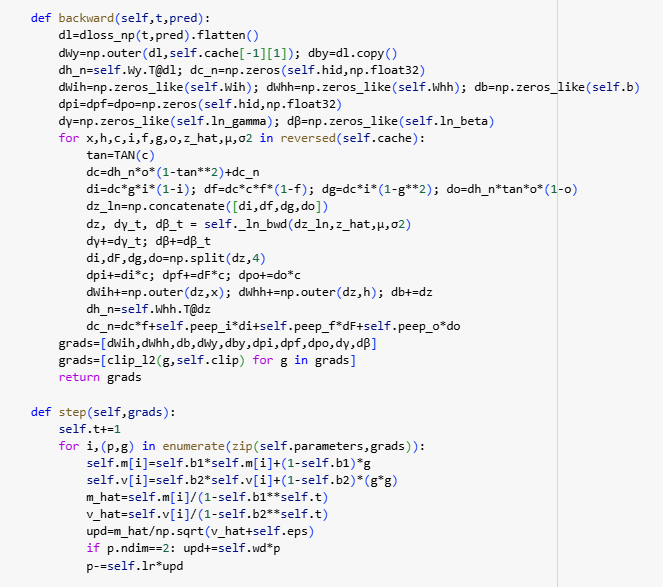

## **Training**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

[INFO] device: cpu
[INFO] 9400 CSVs found
[INFO] targets: ['Local_X', 'Local_Y']
[SPLIT] 6580 train | 1410 val | 1410 test
[LOAD] building windows…
[SHAPE] (6580, 62, 12) (1410, 62, 12) (1410, 62, 12)

=== NumPy ===
[NumPySGD] ep01 tr=0.458 val=0.457
[NumPySGD] ep02 tr=0.457 val=0.456
[NumPySGD] ep03 tr=0.456 val=0.455
[NumPySGD] ep04 tr=0.456 val=0.455
[NumPySGD] ep05 tr=0.455 val=0.454
[NumPySGD] ep06 tr=0.454 val=0.453
[NumPySGD] ep07 tr=0.454 val=0.453
[NumPySGD] ep08 tr=0.453 val=0.452
[NumPySGD] ep09 tr=0.452 val=0.451
[NumPySGD] ep10 tr=0.451 val=0.450
[NumPySGD] ep11 tr=0.451 val=0.450
[NumPySGD] ep12 tr=0.450 val=0.449
[NumPySGD] ep13 tr=0.449 val=0.448
[NumPySGD] ep14 tr=0.448 val=0.447
[NumPySGD] ep15 tr=0.448 val=0.446
[NumPySGD] ep16 tr=0.447 val=0.446
[NumPySGD] ep17 tr=0.446 val=0.445
[NumPySGD] ep18 tr=0.445 val=0.444
[NumPySGD] ep19 tr=0.444 val=0.443
[NumPySGD] ep20 tr=0.443 val=0.442
[NumPyAdamW] ep01 tr=0.286 val=0.034
[NumPyAdamW] ep02 tr=0.013 val=0.007
[NumPyAdam

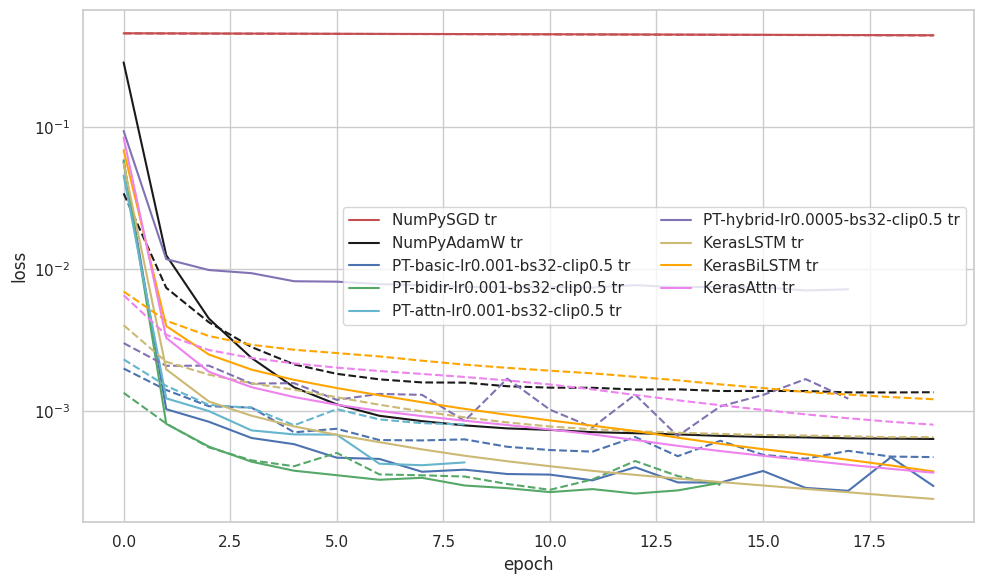

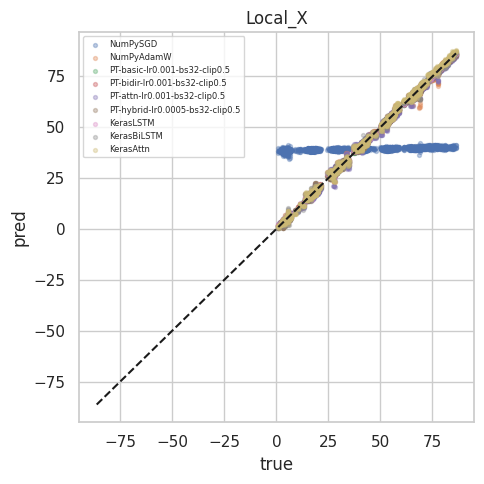

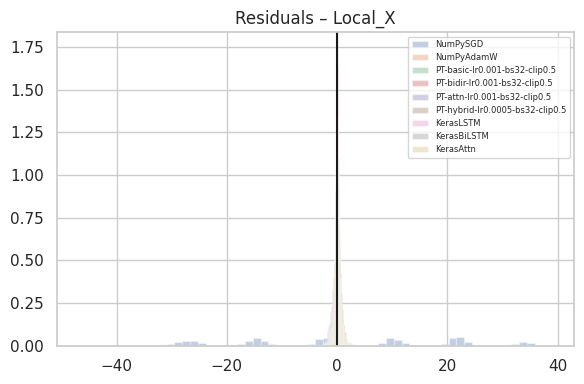

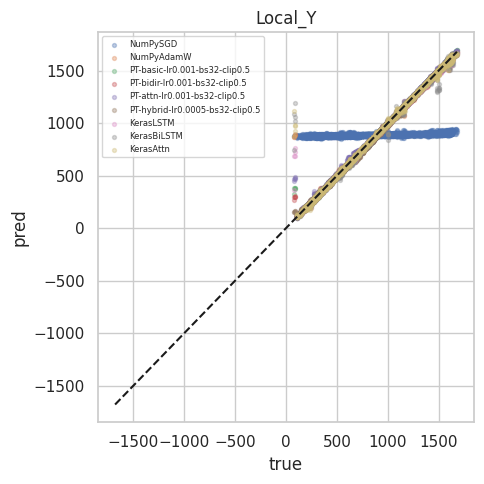

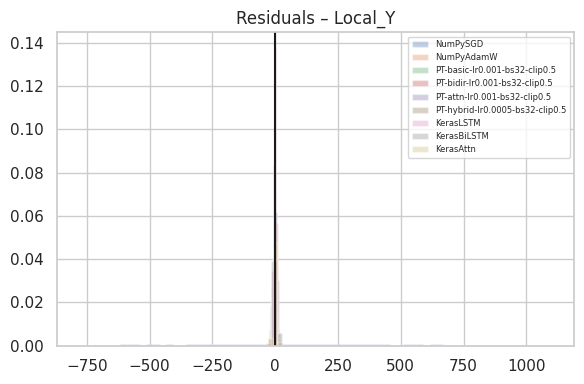

[✓] scalers saved to /content/drive/MyDrive/TrajectoryModels/scalers.npz
[✓] everything saved in /content/drive/MyDrive/TrajectoryModels


In [ ]:
# 0. imports & global cfg
import os, random, math, copy, pathlib, warnings, itertools, shutil
import numpy  as np
import pandas as pd
import matplotlib.pyplot as plt; import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import torch, torch.nn as nn, torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau

import tensorflow as tf; from tensorflow import keras
from tensorflow.keras.layers import (Input, LSTM, Dense, Reshape,
                                     Bidirectional, Attention, Concatenate)
warnings.filterwarnings("ignore"); sns.set(style="whitegrid")

SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); tf.random.set_seed(SEED)

INPUT_LEN, OUTPUT_LEN = 62, 5
HIDDEN_SIZE, INITIAL_LR = 128, 5e-4
BATCH_SIZE, CLIP_VALUE  = 64, .5
LOSS_FUNCTION, HUBER_DELTA = 'huber', 1.0
TRAIN_RATIO, VAL_RATIO = .70, .15
EPOCHS, EARLY_STOP     = 20, 4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("[INFO] device:", DEVICE)

# 1. data discovery / split
DATA_ROOT = "/content/drive/MyDrive/car_data"
SAVE_DIR   = "/content/drive/MyDrive/TrajectoryModels"
if not os.path.isdir(DATA_ROOT):
    raise FileNotFoundError(f"{DATA_ROOT} missing – mount Drive!")

csv_files = sorted(pathlib.Path(DATA_ROOT).rglob("*.csv"))
if not csv_files: raise RuntimeError("no CSVs found")
print(f"[INFO] {len(csv_files)} CSVs found")

with open(csv_files[0]) as f: header = f.readline().strip().split(',')
TARGET_COLS = ['Local_X', 'Local_Y']; TARGET_IDX=[header.index(c) for c in TARGET_COLS]
OUT_FEAT = len(TARGET_COLS); print("[INFO] targets:", TARGET_COLS)

random.shuffle(csv_files)
cut1=int(len(csv_files)*TRAIN_RATIO); cut2=int(len(csv_files)*(TRAIN_RATIO+VAL_RATIO))
train_files, val_files, test_files = csv_files[:cut1], csv_files[cut1:cut2], csv_files[cut2:]
print(f"[SPLIT] {len(train_files)} train | {len(val_files)} val | {len(test_files)} test")

# 2. window builder
INPUT_TOTAL = INPUT_LEN+OUTPUT_LEN
def make_windows(files, fit=False, sX=None, sY=None):
    Xs, Ys, infos = [], [], []
    for fp in files:
        arr = np.loadtxt(fp, delimiter=',', skiprows=1).astype(np.float32)
        L=len(arr)
        if L>=INPUT_TOTAL:
            for i in range(L-INPUT_TOTAL+1):
                Xs.append(arr[i:i+INPUT_LEN])
                Ys.append(arr[i+INPUT_LEN:i+INPUT_TOTAL, TARGET_IDX])
                infos.append({'file':fp.name,'start':i})
        else:
            need=INPUT_TOTAL-L; pad_past=max(0,INPUT_LEN-L); pad_fut=need-pad_past
            padded=np.vstack([np.repeat(arr[0:1],pad_past,0),arr,
                              np.repeat(arr[-1:],pad_fut,0)])
            Xs.append(padded[:INPUT_LEN])
            Ys.append(padded[INPUT_LEN:INPUT_TOTAL,TARGET_IDX])
            infos.append({'file':fp.name,'start':0,'padded':True})
    X,Y=np.stack(Xs),np.stack(Ys)
    if fit:
        sX=StandardScaler().fit(X.reshape(-1,X.shape[2]))
        sY=StandardScaler().fit(Y.reshape(-1,OUT_FEAT))
    X=sX.transform(X.reshape(-1,X.shape[2])).reshape(X.shape)
    Y=sY.transform(Y.reshape(-1,OUT_FEAT)).reshape(Y.shape)
    return X,Y,sX,sY,infos

print("[LOAD] building windows…")
X_train,Y_train,sX,sY,_ = make_windows(train_files,fit=True)
X_val,  Y_val,  _, _, _ = make_windows(val_files, sX=sX, sY=sY)
X_test, Y_test, _, _, it= make_windows(test_files,sX=sX,sY=sY)
print("[SHAPE]", X_train.shape, X_val.shape, X_test.shape)

def inv_scale(a): return sY.inverse_transform(a.reshape(-1,OUT_FEAT))\
                             .reshape(-1,OUTPUT_LEN,OUT_FEAT)
true_all = inv_scale(Y_test)

# 3. loss helpers
def mse_np(t,p):     return np.mean((p-t)**2)
def dmse_np(t,p):    return p-t
def huber_np(t,p,δ=HUBER_DELTA):
    e=p-t; a=np.abs(e); q=np.minimum(a,δ)
    return np.mean(0.5*q**2+δ*(a-q))
def dhuber_np(t,p,δ=HUBER_DELTA):
    e=p-t; a=np.abs(e); return np.where(a<=δ,e,δ*np.sign(e))
loss_np  = huber_np  if LOSS_FUNCTION=='huber' else mse_np
dloss_np = dhuber_np if LOSS_FUNCTION=='huber' else dmse_np

# 4. NumPy LSTM classes
_CLIP_ACT=5.0
def SIG(x): return 1/(1+np.exp(-np.clip(x,-_CLIP_ACT,_CLIP_ACT)))
def TAN(x): return np.tanh(np.clip(x,-_CLIP_ACT,_CLIP_ACT))
def clip_l2(g,l): n=np.sqrt((g**2).sum()); return g if n<=l else g*(l/(n+1e-12))

class MyLSTM:
    def __init__(self,inp_dim,hid,fh,td,lr=1e-3,clip=.5,drop=0.):
        self.i_dim,self.hid,self.fh,self.td = inp_dim,hid,fh,td
        self.lr,self.clip,self.drop = lr,clip,drop
        def xavier(sh): lim=math.sqrt(6/sum(sh)); return np.random.uniform(-lim,lim,sh).astype(np.float32)
        self.Wih=xavier((4*hid,inp_dim)); self.Whh=xavier((4*hid,hid))
        self.b=np.zeros(4*hid,np.float32)
        self.b[hid:2*hid]=+1; self.b[:hid]=-3; self.b[3*hid:]=-1
        self.Wy=xavier((fh*td,hid)); self.by=np.zeros(fh*td,np.float32)
        self.parameters=[self.Wih,self.Whh,self.b,self.Wy,self.by]

    def forward(self,seq,training=False):
        h=np.zeros(self.hid,np.float32); c=np.zeros_like(h)
        if training: self.cache=[]
        for x in seq:
            z=self.Wih@x + self.Whh@h + self.b
            i,f,g,o=np.split(z,4); i,f,o=map(SIG,(i,f,o)); g=TAN(g)
            if training and self.drop:
                mask=(np.random.rand(*h.shape)>self.drop).astype(np.float32)
                h*=mask/(1-self.drop)
            c=f*c+i*g; h=o*TAN(c)
            if training: self.cache.append((x,h.copy(),c.copy(),i,f,g,o))
        logit=self.Wy@h + self.by
        return logit.reshape(self.fh,self.td)

    def backward(self,t,pred):
        dl=dloss_np(t,pred).flatten()
        dWy=np.outer(dl,self.cache[-1][1]); dby=dl.copy()
        dh_n=self.Wy.T@dl; dc_n=np.zeros(self.hid,np.float32)
        dWih=np.zeros_like(self.Wih); dWhh=np.zeros_like(self.Whh); db=np.zeros_like(self.b)
        for x,h,c,i,f,g,o in reversed(self.cache):
            tan=TAN(c)
            dc=dh_n*o*(1-tan**2)+dc_n
            di=dc*g*i*(1-i); df=dc*c*f*(1-f); dg=dc*i*(1-g**2); do=dh_n*tan*o*(1-o)
            dz=np.concatenate([di,df,dg,do])
            dWih+=np.outer(dz,x); dWhh+=np.outer(dz,h); db+=dz
            dh_n=self.Whh.T@dz; dc_n=dc*f
        for d in (dWih,dWhh,db,dWy,dby): np.clip(d,-self.clip,self.clip,out=d)
        return [dWih,dWhh,db,dWy,dby]

    def step(self,grads):
        for p,g in zip(self.parameters,grads): p-=self.lr*g

class EnhancedMyLSTM(MyLSTM):
    def __init__(self,*a,dropout=.2,eps=1e-5,wd=1e-4,**kw):
        super().__init__(*a,drop=dropout,**kw)
        hid=self.hid
        self.peep_i=self.peep_f=self.peep_o=np.zeros(hid,np.float32)
        self.ln_gamma=np.ones(4*hid,np.float32); self.ln_beta=np.zeros(4*hid,np.float32)
        self.parameters+= [self.peep_i,self.peep_f,self.peep_o,self.ln_gamma,self.ln_beta]
        self.eps,self.wd=eps,wd
        self.m=[np.zeros_like(p) for p in self.parameters]
        self.v=[np.zeros_like(p) for p in self.parameters]
        self.b1,self.b2,self.t=0.9,0.999,0

    def _ln(self,z): m=z.mean(); v=z.var(); return (z-m)/np.sqrt(v+self.eps),m,v
    def forward(self,seq,training=False):
        h=np.zeros(self.hid,np.float32); c=np.zeros_like(h)
        if training: self.cache=[]
        for x in seq:
            z=self.Wih@x + self.Whh@h + self.b + \
                np.concatenate([self.peep_i*c,self.peep_f*c,np.zeros_like(c),self.peep_o*c])
            z_hat,μ,σ2=self._ln(z); z_ln=z_hat*self.ln_gamma+self.ln_beta
            i,f,g,o=np.split(z_ln,4); i,f,o=map(SIG,(i,f,o)); g=TAN(g)
            if training and self.drop:
                mask=(np.random.rand(*h.shape)>self.drop).astype(np.float32)
                h*=mask/(1-self.drop)
            c=f*c+i*g; h=o*TAN(c)
            if training: self.cache.append((x,h.copy(),c.copy(),i,f,g,o,z_hat,μ,σ2))
        return (self.Wy@h+self.by).reshape(self.fh,self.td)

    def _ln_bwd(self,dout,z_hat,μ,σ2):
        N=len(z_hat); dγ=(dout*z_hat).sum(); dβ=dout.sum()
        dz_hat=dout*self.ln_gamma
        dσ2=-.5*(σ2+self.eps)**-1.5*(dz_hat*z_hat).sum()
        dμ=-(dz_hat/np.sqrt(σ2+self.eps)).sum()-2*dσ2*z_hat.mean()
        dz=dz_hat/np.sqrt(σ2+self.eps)+dσ2*2*z_hat/N+dμ/N
        return dz,dγ,dβ

    def backward(self,t,pred):
        dl=dloss_np(t,pred).flatten()
        dWy=np.outer(dl,self.cache[-1][1]); dby=dl.copy()
        dh_n=self.Wy.T@dl; dc_n=np.zeros(self.hid,np.float32)
        dWih=np.zeros_like(self.Wih); dWhh=np.zeros_like(self.Whh); db=np.zeros_like(self.b)
        dpi=dpf=dpo=np.zeros(self.hid,np.float32)
        dγ=np.zeros_like(self.ln_gamma); dβ=np.zeros_like(self.ln_beta)
        for x,h,c,i,f,g,o,z_hat,μ,σ2 in reversed(self.cache):
            tan=TAN(c)
            dc=dh_n*o*(1-tan**2)+dc_n
            di=dc*g*i*(1-i); df=dc*c*f*(1-f); dg=dc*i*(1-g**2); do=dh_n*tan*o*(1-o)
            dz_ln=np.concatenate([di,df,dg,do])
            dz, dγ_t, dβ_t = self._ln_bwd(dz_ln,z_hat,μ,σ2)
            dγ+=dγ_t; dβ+=dβ_t
            di,dF,dg,do=np.split(dz,4)
            dpi+=di*c; dpf+=dF*c; dpo+=do*c
            dWih+=np.outer(dz,x); dWhh+=np.outer(dz,h); db+=dz
            dh_n=self.Whh.T@dz
            dc_n=dc*f+self.peep_i*di+self.peep_f*dF+self.peep_o*do
        grads=[dWih,dWhh,db,dWy,dby,dpi,dpf,dpo,dγ,dβ]
        grads=[clip_l2(g,self.clip) for g in grads]
        return grads

    def step(self,grads):
        self.t+=1
        for i,(p,g) in enumerate(zip(self.parameters,grads)):
            self.m[i]=self.b1*self.m[i]+(1-self.b1)*g
            self.v[i]=self.b2*self.v[i]+(1-self.b2)*(g*g)
            m_hat=self.m[i]/(1-self.b1**self.t)
            v_hat=self.v[i]/(1-self.b2**self.t)
            upd=m_hat/np.sqrt(v_hat+self.eps)
            if p.ndim==2: upd+=self.wd*p
            p-=self.lr*upd

# 5. trainers – NumPy
def fit_numpy(model,Xtr,Ytr,Xv,Yv,label,batch=32):
    best=np.inf; wait=0; hist={'train':[],'val':[]}
    best_state=[p.copy() for p in model.parameters]
    idx=np.arange(len(Xtr))
    for ep in range(1,EPOCHS+1):
        np.random.shuffle(idx); tr_loss=0.
        for bi in range(0,len(idx),batch):
            sel=idx[bi:bi+batch]
            grads=[np.zeros_like(p) for p in model.parameters]
            for j in sel:
                yp=model.forward(Xtr[j],training=True)
                g=model.backward(Ytr[j],yp)
                grads=[gk+dk for gk,dk in zip(grads,g)]
                tr_loss+=loss_np(Ytr[j],yp)
            grads=[g/len(sel) for g in grads]; model.step(grads)
        tr_loss/=len(Xtr)
        val_loss=np.mean([loss_np(y,model.forward(x)) for x,y in zip(Xv,Yv)])
        hist['train'].append(tr_loss); hist['val'].append(val_loss)
        print(f"[{label}] ep{ep:02d} tr={tr_loss:.3f} val={val_loss:.3f}")
        if val_loss<best: best,val_wait=val_loss,0; best_state=[p.copy() for p in model.parameters]
        else:
            val_wait+=1
            if val_wait>=EARLY_STOP: break
    for p,b in zip(model.parameters,best_state): p[...] = b
    preds=inv_scale(np.array([model.forward(x) for x in X_test]))
    return hist,preds,model

# 6. PyTorch models
class PT_LSTM(nn.Module):
    def __init__(self): super().__init__()
    def forward(self,x): ...

class PTBasic(nn.Module):
    def __init__(self): super().__init__()
    def forward(self,x): ...

class PT_Basic(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm=nn.LSTM(X_train.shape[2],HIDDEN_SIZE,batch_first=True)
        self.fc  =nn.Linear(HIDDEN_SIZE,OUTPUT_LEN*OUT_FEAT)
    def forward(self,x):
        h=self.lstm(x)[0][:,-1]
        return self.fc(h).view(-1,OUTPUT_LEN,OUT_FEAT)

class PT_Bi(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm=nn.LSTM(X_train.shape[2],HIDDEN_SIZE,batch_first=True,bidirectional=True)
        self.fc  =nn.Linear(HIDDEN_SIZE*2,OUTPUT_LEN*OUT_FEAT)
    def forward(self,x):
        h=self.lstm(x)[0][:,-1]
        return self.fc(h).view(-1,OUTPUT_LEN,OUT_FEAT)

class PT_Attn(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm=nn.LSTM(X_train.shape[2],HIDDEN_SIZE,batch_first=True)
        self.Wa  =nn.Linear(HIDDEN_SIZE,HIDDEN_SIZE,bias=False)
        self.fc  =nn.Linear(HIDDEN_SIZE*2,OUTPUT_LEN*OUT_FEAT)
    def forward(self,x):
        seq,(h,_) = self.lstm(x); h=h[-1]
        score=(seq*self.Wa(h).unsqueeze(1)).sum(-1)
        α=torch.softmax(score,dim=-1).unsqueeze(-1)
        ctx=(seq*α).sum(1)
        return self.fc(torch.cat([h,ctx],-1)).view(-1,OUTPUT_LEN,OUT_FEAT)

class PT_Hybrid(nn.Module):
    def __init__(self,hidden=HIDDEN_SIZE,mlp_hidden=256,dropout=.25):
        super().__init__()
        self.lstm=nn.LSTM(X_train.shape[2],hidden,batch_first=True)
        self.drop1=nn.Dropout(dropout)
        self.mlp1=nn.Linear(hidden,mlp_hidden)
        self.drop2=nn.Dropout(dropout)
        self.mlp2=nn.Linear(mlp_hidden,OUTPUT_LEN*OUT_FEAT)
    def forward(self,x):
        h=self.lstm(x)[0][:,-1]
        h=self.drop1(torch.relu(self.mlp1(h)))
        return self.mlp2(self.drop2(h)).view(-1,OUTPUT_LEN,OUT_FEAT)

# 7. PT runner & grid
def run_pt(model, lr, clip, batch, label, sched_cls=None):
    tr_ds = TensorDataset(torch.tensor(X_train), torch.tensor(Y_train))
    va_ds = TensorDataset(torch.tensor(X_val),   torch.tensor(Y_val))
    tr_dl = DataLoader(tr_ds, batch, shuffle=True, num_workers=0)
    va_dl = DataLoader(va_ds, batch,             num_workers=0)

    model.to(DEVICE)
    opt   = optim.Adam(model.parameters(), lr)
    crit  = nn.SmoothL1Loss()
    sched = sched_cls(opt, mode="min", patience=2) if sched_cls else None

    best = float("inf"); wait = 0; best_state = None
    hist = {"train": [], "val": []}

    for ep in range(1, EPOCHS + 1):
        # ---- training -----
        model.train(); tr = 0.0
        for xb, yb in tr_dl:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            opt.zero_grad()
            loss = crit(model(xb), yb)
            loss.backward()
            if clip:
                nn.utils.clip_grad_norm_(model.parameters(), clip)
            opt.step()
            tr += loss.item()
        tr /= len(tr_dl)

        # ---- validation ---
        model.eval(); val = 0.0
        with torch.no_grad():
            for xb, yb in va_dl:
                val += crit(model(xb.to(DEVICE)), yb.to(DEVICE)).item()
        val /= len(va_dl)

        hist["train"].append(tr); hist["val"].append(val)
        if sched:
            sched.step(val)

        if val < best:
            best, wait, best_state = val, 0, copy.deepcopy(model.state_dict())
        else:
            wait += 1
            if wait >= EARLY_STOP:
                break
        print(f"[{label}] ep{ep:02d} tr={tr:.3f} val={val:.3f}")

    # ---- test ----
    model.load_state_dict(best_state); model.eval()
    te_dl = DataLoader(torch.tensor(X_test), batch, num_workers=0)
    preds = []
    with torch.no_grad():
        for xb in te_dl:                         # ← FIXED LINE
            preds.append(model(xb.to(DEVICE)).cpu().numpy())
    preds = inv_scale(np.concatenate(preds, 0))
    return hist, preds, model, best

def grid_search_pt(name,make_model):
    best={'mse':np.inf}
    for lr in [1e-3,5e-4,1e-4]:
        for clip in [None,0.5]:
            for bs in [32,64]:
                tag=f"{name}-lr{lr:g}-bs{bs}-clip{clip}"
                h,p,m,_=run_pt(make_model(),lr,clip,bs,tag)
                mse=mean_squared_error(true_all.reshape(-1,OUT_FEAT),p.reshape(-1,OUT_FEAT))
                if mse<best['mse']: best.update(tag=tag,hist=h,pred=p,model=m,mse=mse)
                print(tag,"MSE",round(mse,3))
    print("[BEST]",name,best['tag'],best['mse'])
    return best['tag'],best['hist'],best['pred'],best['model']

# 8. train runs
print("\n=== NumPy ===")
hist_np,preds_np,np_lstm=fit_numpy(MyLSTM(X_train.shape[2],HIDDEN_SIZE,OUTPUT_LEN,OUT_FEAT,lr=1e-3),
                                   X_train,Y_train,X_val,Y_val,"NumPySGD",batch=32)
hist_enh,preds_enh,enh_lstm=fit_numpy(EnhancedMyLSTM(X_train.shape[2],HIDDEN_SIZE,OUTPUT_LEN,OUT_FEAT,
                                   lr=5e-4,dropout=.1),X_train,Y_train,X_val,Y_val,"NumPyAdamW",batch=32)

print("\n=== PT basic ===")
pt_basic_tag,pt_basic_hist,pt_basic_pred,pt_basic_model = grid_search_pt("PT-basic",PT_Basic)
print("\n=== PT Bi ===")
pt_bi_tag,pt_bi_hist,pt_bi_pred,pt_bi_model = grid_search_pt("PT-bidir",PT_Bi)
print("\n=== PT Attn ===")
pt_attn_tag,pt_attn_hist,pt_attn_pred,pt_attn_model = grid_search_pt("PT-attn",PT_Attn)
print("\n=== PT Hybrid ===")
pt_hyb_tag,pt_hyb_hist,pt_hyb_pred,pt_hyb_model = grid_search_pt("PT-hybrid",PT_Hybrid)

print("\n=== Keras ===")
def K_build(bidir=False,attn=False):
    inp=Input((INPUT_LEN,X_train.shape[2]))
    seq = Bidirectional(LSTM(HIDDEN_SIZE,return_sequences=attn))(inp) if bidir else \
          LSTM(HIDDEN_SIZE,return_sequences=attn)(inp)
    if attn:
        last=seq[:,-1:,:]; ctx=Attention()([last,seq])
        x=Concatenate()([last,ctx]); x=Reshape((2*HIDDEN_SIZE*(2 if bidir else 1),))(x)
    else: x=seq
    out=Dense(OUTPUT_LEN*OUT_FEAT)(x); out=Reshape((OUTPUT_LEN,OUT_FEAT))(out)
    return keras.Model(inp,out)

def fit_keras(model,name,lr):
    model.compile(keras.optimizers.Adam(lr),loss=tf.keras.losses.Huber(delta=HUBER_DELTA))
    es=keras.callbacks.EarlyStopping(patience=EARLY_STOP,restore_best_weights=True,verbose=0)
    h=model.fit(X_train,Y_train,validation_data=(X_val,Y_val),epochs=EPOCHS,
                batch_size=BATCH_SIZE,verbose=0,callbacks=[es]).history
    print(name,"best",min(h['val_loss']))
    return h,inv_scale(model.predict(X_test,BATCH_SIZE,verbose=0)),model

hist_kl,preds_kl,keras_lstm=fit_keras(K_build(),         "KerasLSTM", 1e-3)
hist_klb,preds_klb,keras_blstm=fit_keras(K_build(bidir=True),"KerasBi",5e-4)
hist_kla,preds_kla,keras_attn=fit_keras(K_build(attn=True),"KerasAttn",5e-4)

# metrics
print("\n──────── metrics ─────────────────────────")
for k, v in pred_dict.items():
    mse, rmse, mae, r2 = metr(true_all, v)
    print(f"{k:<18} MSE={mse:9.2f}  RMSE={rmse:7.2f}  MAE={mae:6.2f}  R²={r2:.4f}")

# loss‑curve figure
plt.figure(figsize=(10, 6))
def _p(h, c, l): plt.plot(h['train'], c+'-', label=f"{l} tr"); plt.plot(h['val'], c+'--')
_p(hist_np,   'r', 'NumPySGD')
_p(hist_enh,  'k', 'NumPyAdamW')
_p(pt_basic_hist, 'b', pt_basic_tag)
_p(pt_bi_hist,    'g', pt_bi_tag)
_p(pt_attn_hist,  'c', pt_attn_tag)
_p(pt_hyb_hist,   'm', pt_hyb_tag)
plt.plot(hist_kl ['loss'],      'y-',      label='KerasLSTM tr')
plt.plot(hist_kl ['val_loss'],  'y--')
plt.plot(hist_klb['loss'],      'orange',  label='KerasBiLSTM tr')
plt.plot(hist_klb['val_loss'],  'orange',  linestyle='--')
plt.plot(hist_kla['loss'],      'violet',  label='KerasAttn tr')
plt.plot(hist_kla['val_loss'],  'violet',  linestyle='--')
plt.yscale('log'); plt.xlabel("epoch"); plt.ylabel("loss"); plt.legend(ncol=2)
plt.tight_layout(); plt.show()

# full‑test scatter / residuals
for v, col in enumerate(TARGET_COLS):
    t = true_all[:, :, v].flatten()
    plt.figure(figsize=(5, 5))
    for k, p in pred_dict.items():
        plt.scatter(t, p[:, :, v].flatten(), s=8, alpha=.35, label=k)
    m = np.abs(t).max()
    plt.plot([-m, m], [-m, m], 'k--'); plt.title(col)
    plt.xlabel("true"); plt.ylabel("pred"); plt.legend(fontsize=6)
    plt.tight_layout(); plt.show()

    plt.figure(figsize=(6, 4))
    for k, p in pred_dict.items():
        plt.hist((p[:, :, v] - true_all[:, :, v]).flatten(),
                 bins=60, alpha=.35, density=True, label=k)
    plt.axvline(0, color='k'); plt.title("Residuals – " + col)
    plt.legend(fontsize=6); plt.tight_layout(); plt.show()

# save scalers
np.savez(
    os.path.join(SAVE_DIR, "scalers.npz"),
    x_mean=sX.mean_,  x_scale=sX.scale_,
    y_mean=sY.mean_,  y_scale=sY.scale_
)
print("[✓] scalers saved to", os.path.join(SAVE_DIR, "scalers.npz"))

# save models
np.savez(os.path.join(SAVE_DIR, "NumPySGD.npz"),   *np_lstm.parameters)
np.savez(os.path.join(SAVE_DIR, "NumPyAdamW.npz"), *enh_lstm.parameters)
torch.save(pt_basic_model.state_dict(), os.path.join(SAVE_DIR, f"{pt_basic_tag}.pt"))
torch.save(pt_bi_model.state_dict(),    os.path.join(SAVE_DIR, f"{pt_bi_tag}.pt"))
torch.save(pt_attn_model.state_dict(),  os.path.join(SAVE_DIR, f"{pt_attn_tag}.pt"))
torch.save(pt_hyb_model.state_dict(),   os.path.join(SAVE_DIR, f"{pt_hyb_tag}.pt"))
keras_lstm.save (os.path.join(SAVE_DIR, "KerasLSTM.keras"))
keras_blstm.save(os.path.join(SAVE_DIR, "KerasBiLSTM.keras"))
keras_attn.save(os.path.join(SAVE_DIR, "KerasAttn.keras"))
print("[✓] everything saved in", SAVE_DIR)


## **Testing**

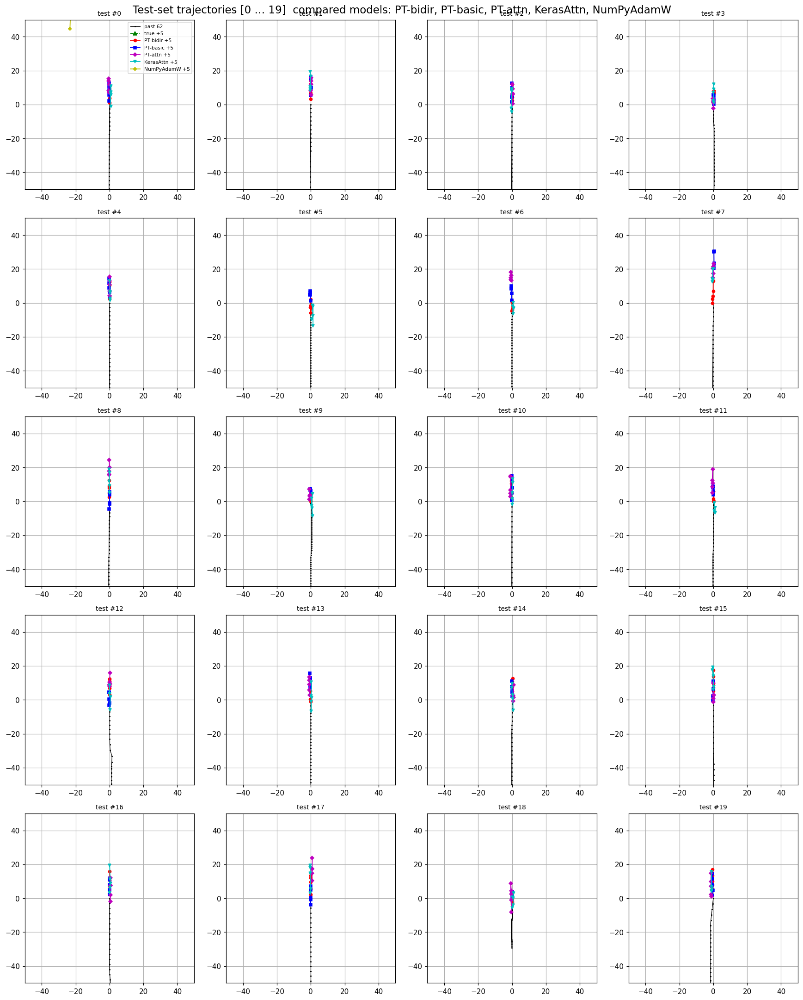

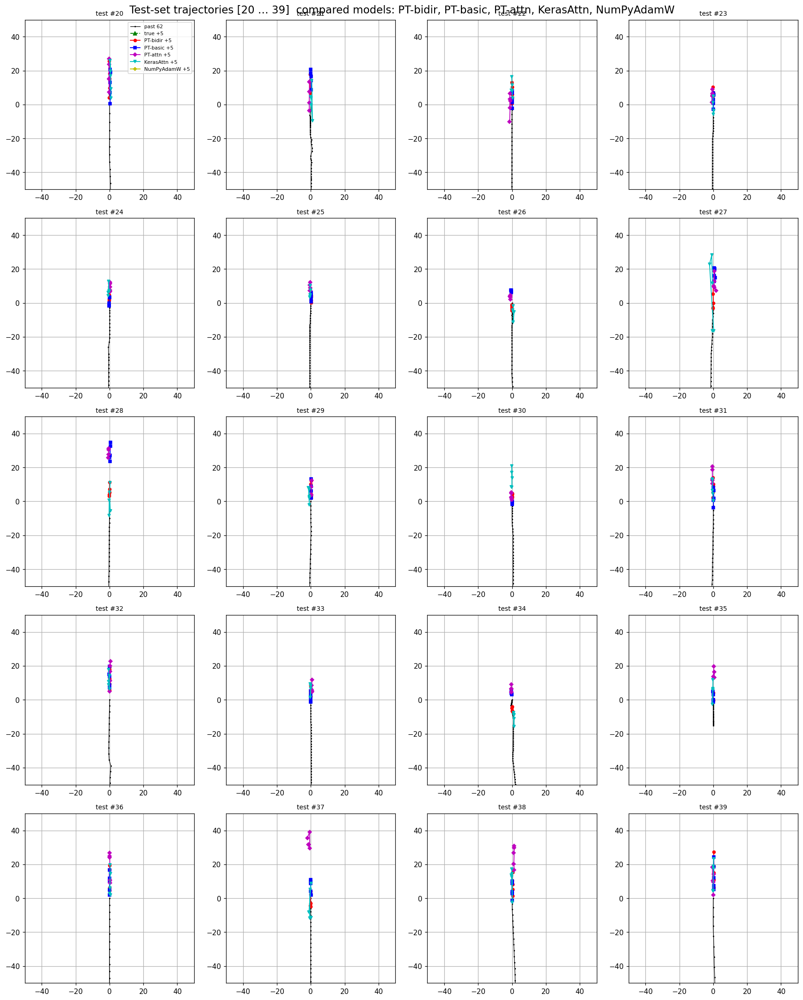

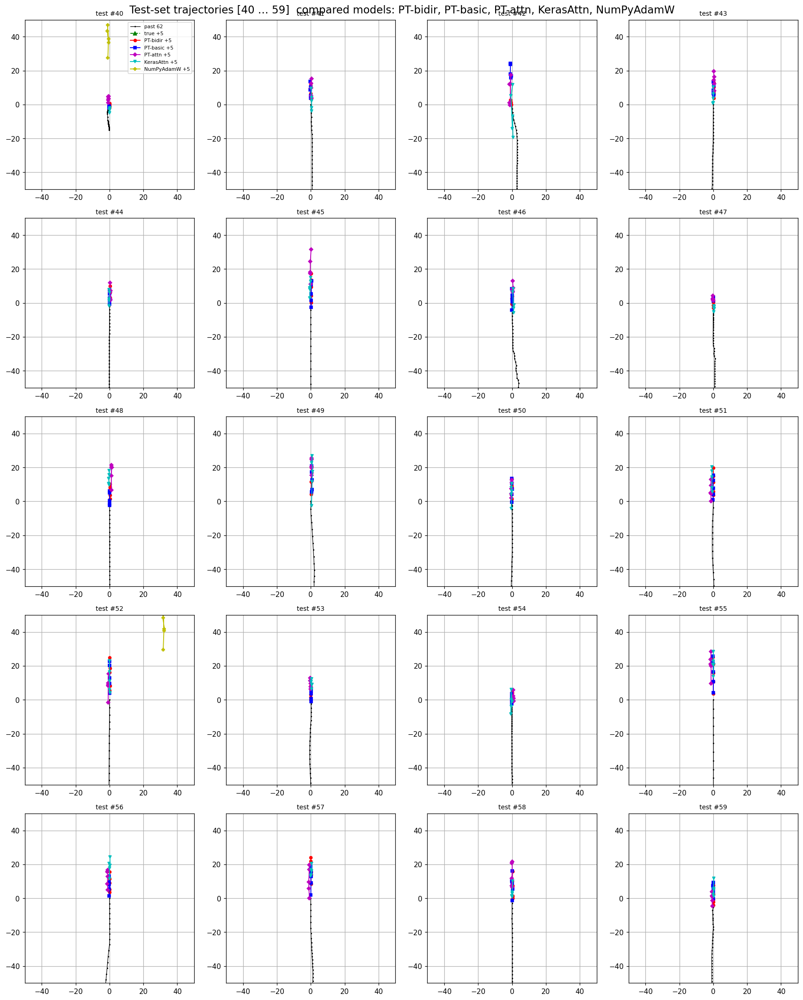

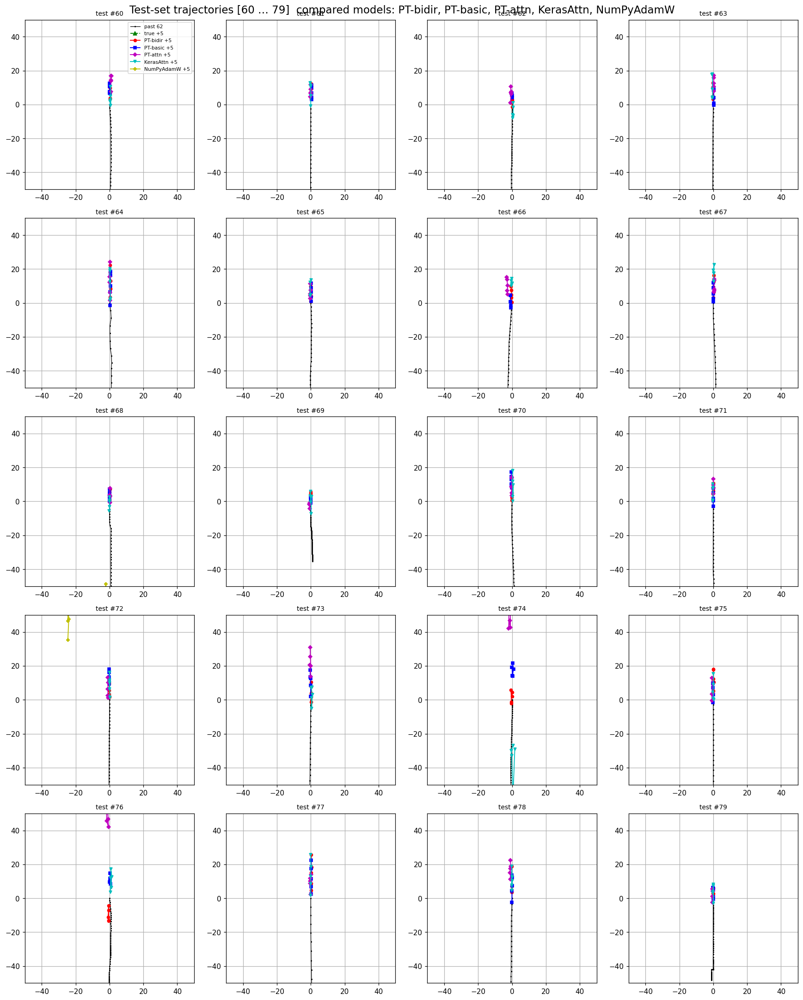

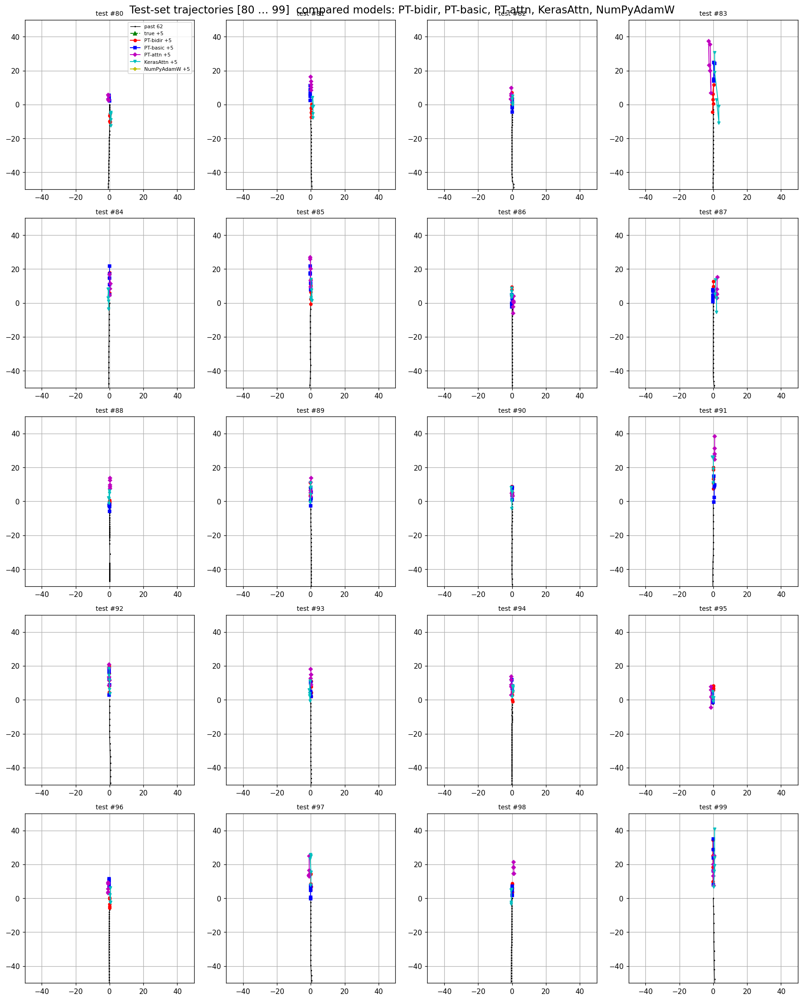

...

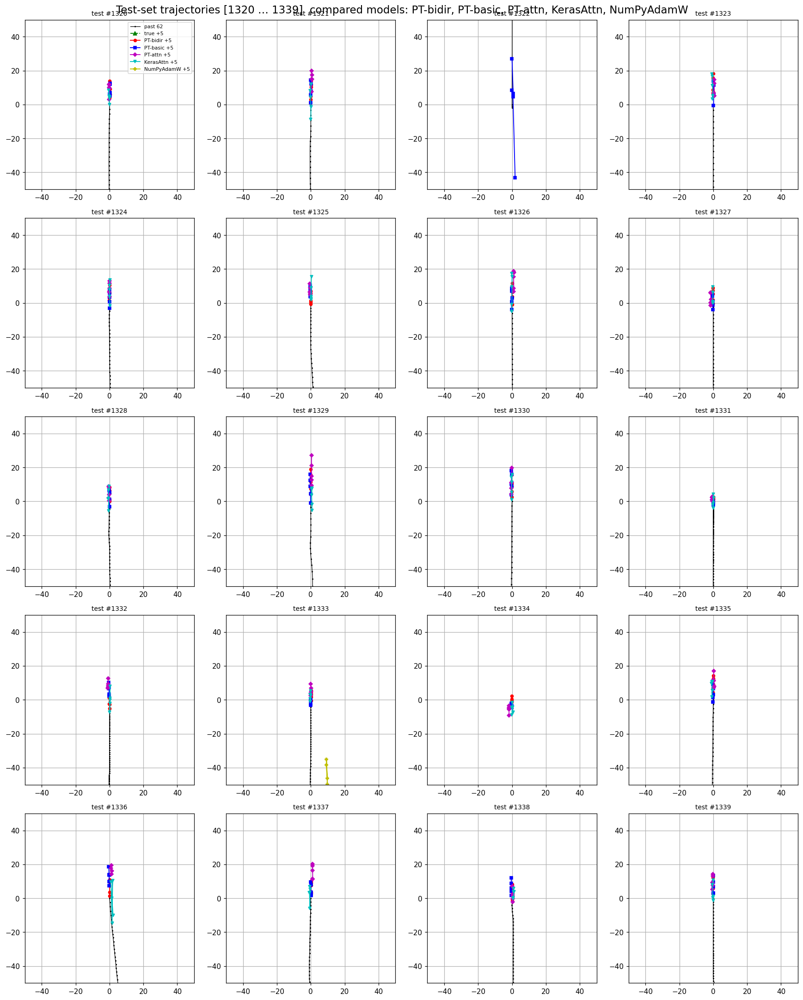

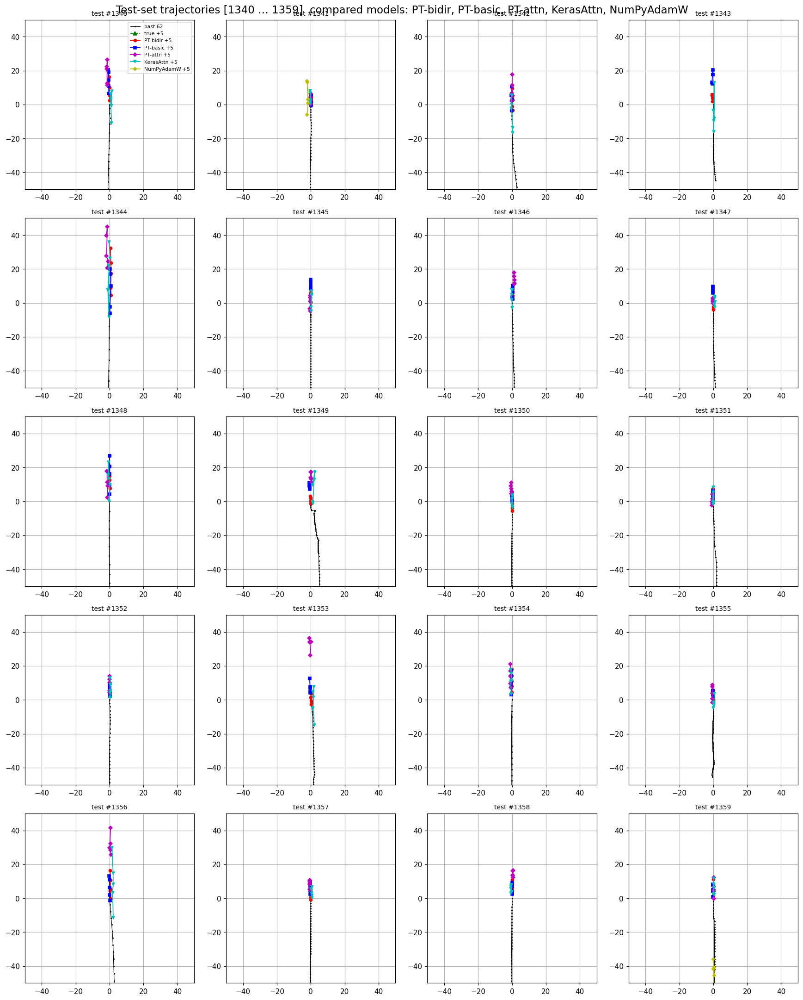

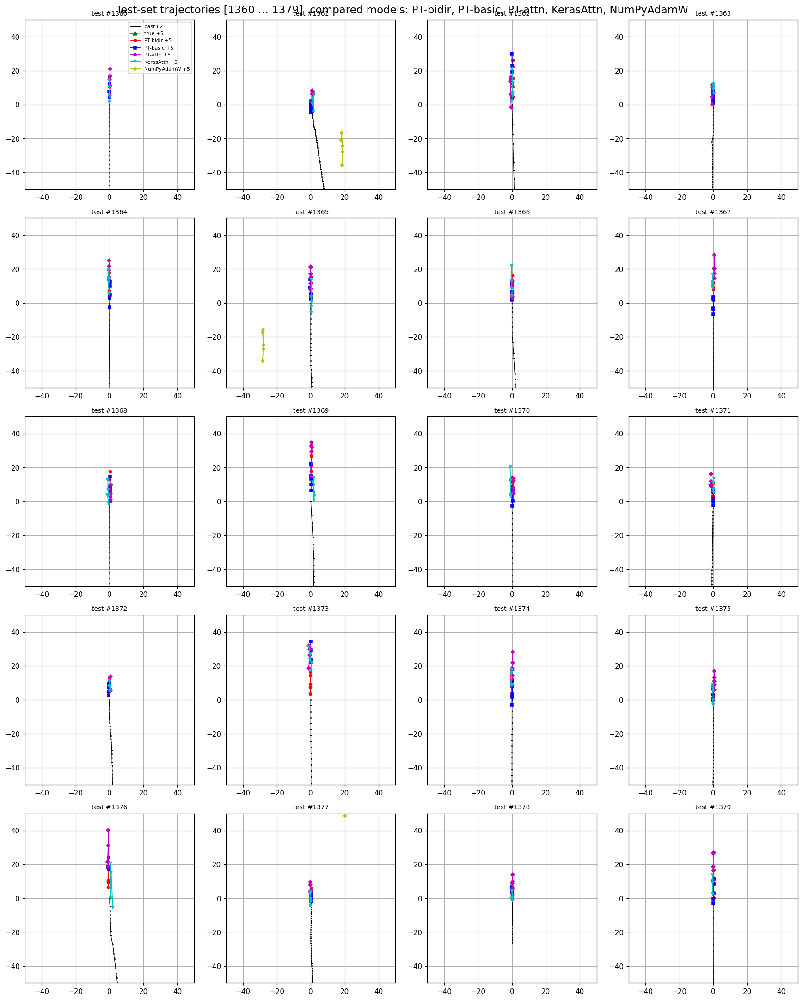

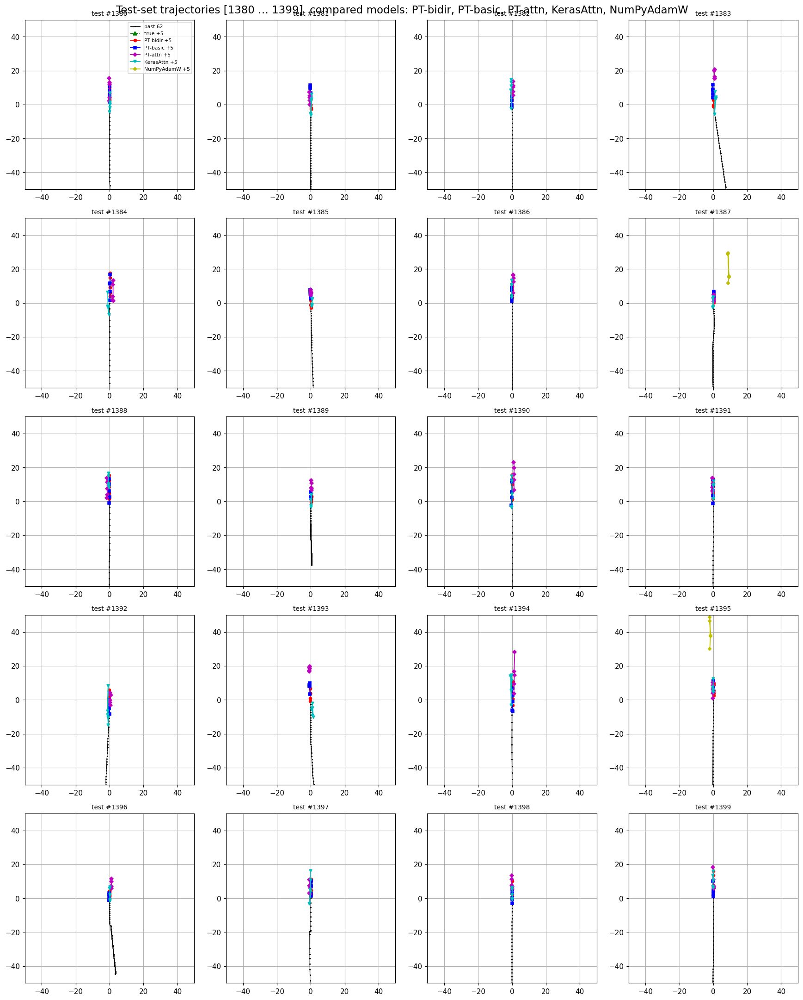

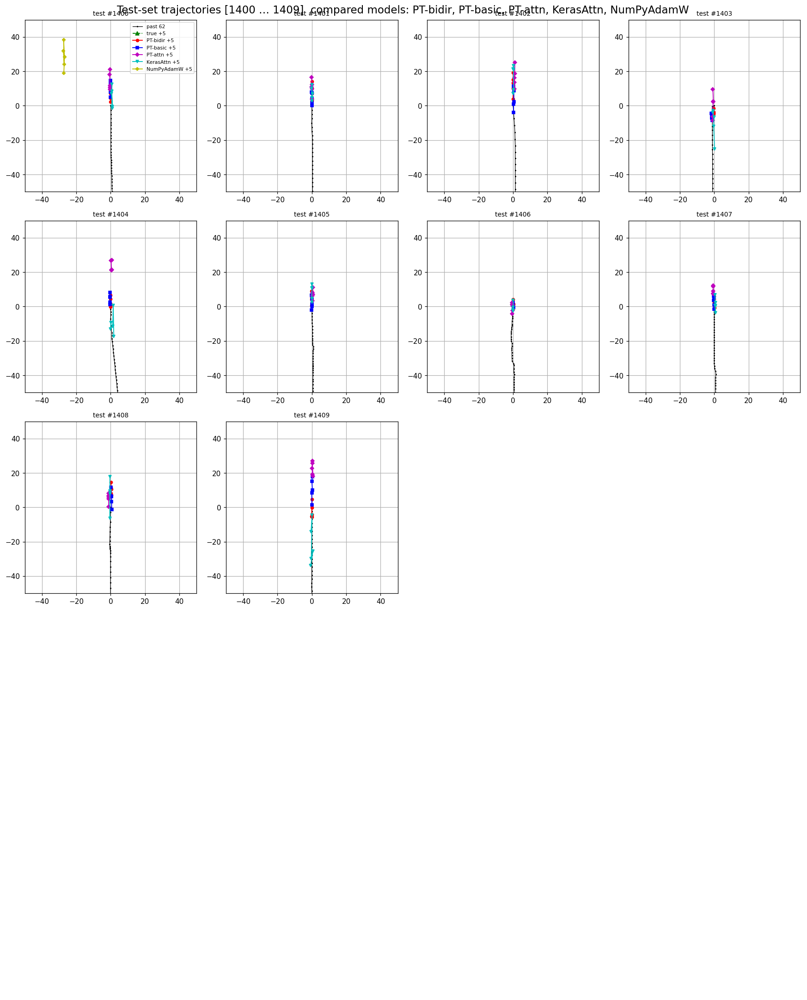

In [ ]:

import math, matplotlib.pyplot as plt, numpy as np

#  the models
models_to_show = ["PT-bidir", "PT-basic", "PT-attn",
                  "KerasAttn", "NumPyAdamW"]   # ≤ 5
horizon        = 5              # how many steps each pred contains

# sanity‑check
missing = [m for m in models_to_show if m not in pred]
assert not missing, f"predictions not found for: {missing}"

# colour/marker table
cmap = ["r", "b", "m", "c", "y"]
mmap = ["o", "s", "D", "v", "P"]   # circle, square, diamond …

# ── plotting constants --------------------------------------------------
N              = len(X_test)
samples_per_fig = 20
cols, rows     = 4, math.ceil(samples_per_fig/4)

for start in range(0, N, samples_per_fig):
    end  = min(start+samples_per_fig, N)
    fig, axs = plt.subplots(rows, cols,
                            figsize=(cols*4, rows*4),
                            squeeze=False)

    for k in range(rows*cols):
        r, c  = divmod(k, cols)
        ax    = axs[r][c]
        idx   = start + k
        if idx < end:
            # ------------- data in *absolute* coords --------------------
            past_xy = sX.inverse_transform(
                          X_test[idx].reshape(-1, X_test.shape[2])
                      )[:, :2]                       # (62,2)
            true_xy = true_all[idx, :horizon]        # (horizon,2)

            # anchor = last observed point
            anchor  = past_xy[-1]
            past    = past_xy - anchor
            true5   = true_xy - anchor

            ax.plot(past[:,0], past[:,1], 'k.-', lw=.8, ms=2, label='past 62')
            ax.plot(true5[:,0], true5[:,1], 'g^--', lw=1.2, ms=5, label='true +5')

            # ------------- overlay every chosen model -------------------
            for m_i, m_name in enumerate(models_to_show):
                col = cmap[m_i % len(cmap)]
                mk  = mmap[m_i % len(mmap)]
                pred_xy = pred[m_name][idx, :horizon] - anchor
                ax.plot(pred_xy[:,0], pred_xy[:,1],
                        color=col, marker=mk, lw=1.2, ms=4,
                        label=f"{m_name} +{horizon}")

            ax.set_title(f"test #{idx}", fontsize=9)
            ax.set_xlim(-50, 50); ax.set_ylim(-50, 50)   # zoom window
            ax.set_aspect('equal'); ax.grid(True)
        else:
            ax.axis('off')

    # legend once (upper‑left)
    handles, labels = axs[0][0].get_legend_handles_labels()
    axs[0][0].legend(handles, labels, fontsize=7, loc='upper right')

    fig.suptitle(f"Test‑set trajectories [{start} … {end-1}]  "
                 f"compared models: {', '.join(models_to_show)}",
                 fontsize=15)
    plt.tight_layout(); plt.show()



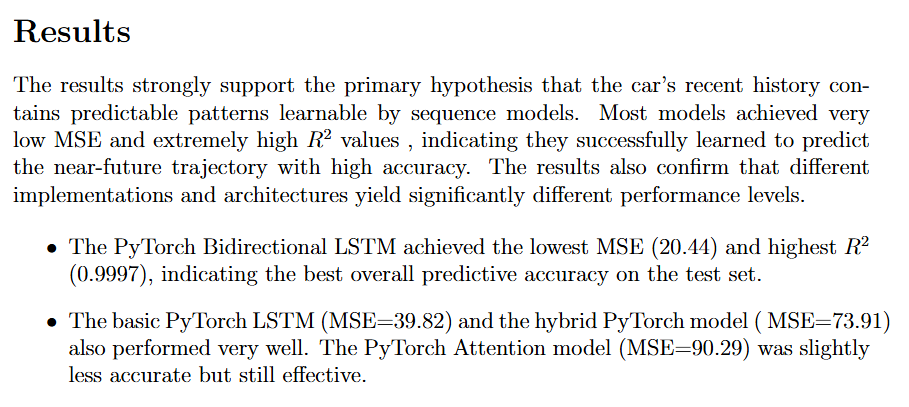 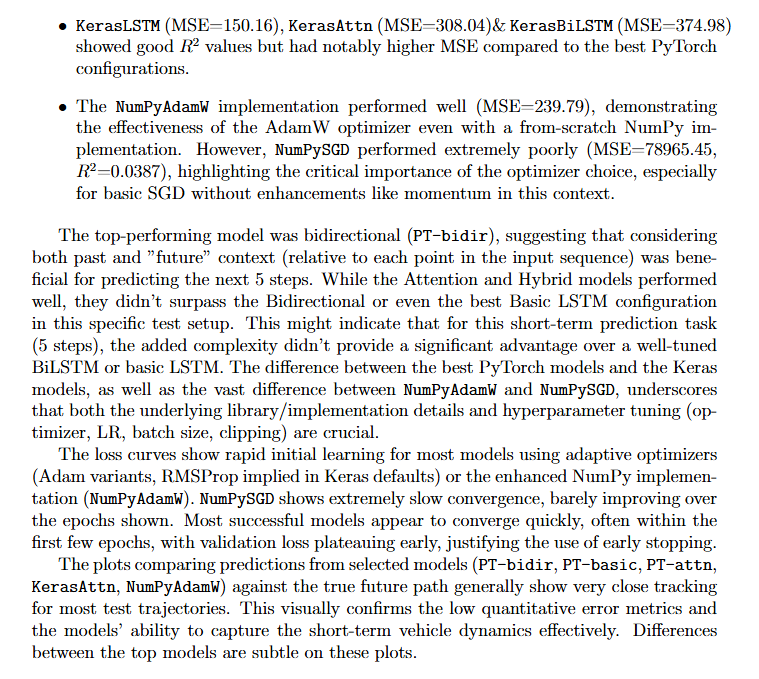

## Future Work direction can be in exploring  Transformers  or Temporal Convolutional Networks (TCNs) for this task. While LSTMs for trajectory prediction are common, the novelty could lie in the breadth of the comparison across implementations and architectures, the detailed analysis of hyperparameters like clipping, or insights gained from incorporating more complex features. Emphasizing the practical application and the high fidelity achieved could be key.

Future Work direction can be in exploring  Transformers  or Temporal Convolutional Networks (TCNs) for this task. Comparing these against the LSTM baselines could be insightful. The most promising angle for a publiction seems to be a comparative study of sequence models for short-term vehicle trajectory prediction. While LSTMs for trajectory prediction are common, the novelty could lie in the breadth of the comparison across implementations and architectures on this specific dataset, the detailed analysis of hyperparameters like clipping, or insights gained from incorporating more complex features (if pursued in future work). Emphasizing the practical application and the high fidelity achieved could be key.

Future Work direction can be in exploring  Transformers  or Temporal Convolutional Networks (TCNs) for this task. Comparing these against the LSTM baselines could be insightful. The most promising angle for a publiction seems to be a comparative study of sequence models for short-term vehicle trajectory prediction. While LSTMs for trajectory prediction are common, the novelty could lie in the breadth of the comparison across implementations and architectures on this specific dataset, the detailed analysis of hyperparameters like clipping, or insights gained from incorporating more complex features (if pursued in future work). Emphasizing the practical application and the high fidelity achieved could be key.